# Image Denoising with Diffusion Models

## Importing Libraries

In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from tqdm import tqdm

## Device Settings

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## Model's Configuration

In [3]:
batch_size = 256
learning_rate = 1e-3
num_epochs = 100
noise_steps = 1000  # Number of noise steps in the diffusion process
image_size = 32  # CIFAR-10 image size
num_classes = 10  # Number of CIFAR-10 classes
n_T = 400 # 500
n_feat = 128
save_model = True
save_dir = './diffusion_model/'
ws_test = [0.0, 0.5, 2.0] # strength of generative guidance

## Visualizing CIFAR-10 Images

In [4]:
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
])
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

100%|██████████| 170498071/170498071 [00:03<00:00, 49331977.83it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data


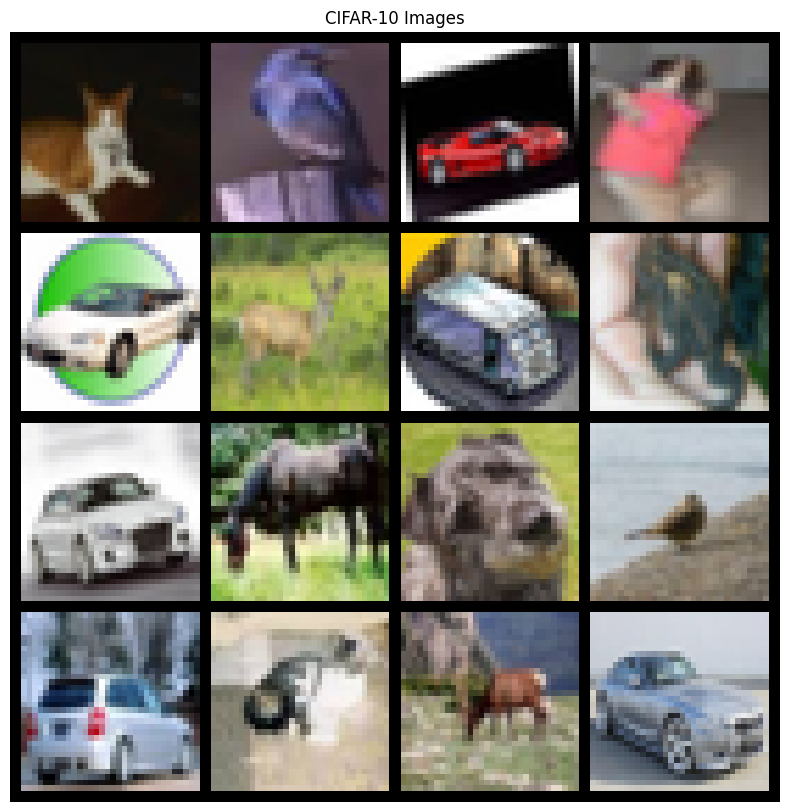

In [6]:
# Get a batch of images from the train_loader
data_iter = iter(train_loader)
images, labels = next(data_iter)

# Plot images
plt.figure(figsize=(10, 10))
grid = make_grid(images[:16], nrow=4)  # Plot the first 16 images in a 4x4 grid
plt.imshow(grid.permute(1, 2, 0))  # Permute to (H, W, C) format for matplotlib
plt.title("CIFAR-10 Images")
plt.axis("off")
plt.show()

## Model Definition

In [7]:
class ResidualConvBlock(nn.Module):
    def __init__(
        self, in_channels: int, out_channels: int, is_res: bool = False
    ) -> None:
        super().__init__()
        self.same_channels = in_channels==out_channels
        self.is_res = is_res
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        if self.is_res:
            x1 = self.conv1(x)
            x2 = self.conv2(x1)
            # this adds on correct residual in case channels have increased
            if self.same_channels:
                out = x + x2
            else:
                out = x1 + x2
            return out / 1.414
        else:
            x1 = self.conv1(x)
            x2 = self.conv2(x1)
            return x2

In [8]:
class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetDown, self).__init__()
        layers = [ResidualConvBlock(in_channels, out_channels), nn.MaxPool2d(2)]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [9]:
class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetUp, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, 2, 2),
            ResidualConvBlock(out_channels, out_channels),
            ResidualConvBlock(out_channels, out_channels),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)
        x = self.model(x)
        return x

In [10]:
class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)

In [11]:
class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat = 256, n_classes=10):
        super(ContextUnet, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes

        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        self.down1 = UnetDown(n_feat, n_feat)
        self.down2 = UnetDown(n_feat, 2 * n_feat)

        self.to_vec = nn.Sequential(nn.AvgPool2d(8), nn.GELU())

        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_classes, 2*n_feat)
        self.contextembed2 = EmbedFC(n_classes, 1*n_feat)

        self.up0 = nn.Sequential(
            # nn.ConvTranspose2d(6 * n_feat, 2 * n_feat, 7, 7), # when concat temb and cemb end up w 6*n_feat
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, 8, 8), # otherwise just have 2*n_feat
            nn.GroupNorm(8, 2 * n_feat),
            nn.ReLU(),
        )

        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1),
            nn.GroupNorm(8, n_feat),
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1),
        )

    #implement multi hot enconding function to produce multi category images
    def one_hot(self,c,num_classes):
        c_return = torch.zeros(len(c),num_classes)
        for i,value in enumerate(c):
            c_return[i, value] = 1.0
        return c_return

    def forward(self, x, c, t, context_mask):
        # x is (noisy) image, c is context label, t is timestep,
        # context_mask says which samples to block the context on

        x = self.init_conv(x)
        down1 = self.down1(x)
        down2 = self.down2(down1)
        hiddenvec = self.to_vec(down2)

        # convert context to one hot embedding
        c = self.one_hot(c, self.n_classes)

        # mask out context if context_mask == 1
        context_mask = context_mask[:, None]
        context_mask = context_mask.repeat(1,self.n_classes)
        context_mask = (-1*(1-context_mask)) # need to flip 0 <-> 1
        c = c.to(device)* context_mask

        # embed context, time step
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)


        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1+ temb1, down2)
        up3 = self.up2(cemb2*up2+ temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out

In [12]:
def ddpm_schedules(beta1, beta2, T):

    assert beta1 < beta2 < 1.0, "beta1 and beta2 must be in (0, 1)"

    beta_t = (beta2 - beta1) * torch.arange(0, T + 1, dtype=torch.float32) / T + beta1
    sqrt_beta_t = torch.sqrt(beta_t)
    alpha_t = 1 - beta_t
    log_alpha_t = torch.log(alpha_t)
    alphabar_t = torch.cumsum(log_alpha_t, dim=0).exp()

    sqrtab = torch.sqrt(alphabar_t)
    oneover_sqrta = 1 / torch.sqrt(alpha_t)

    sqrtmab = torch.sqrt(1 - alphabar_t)
    mab_over_sqrtmab_inv = (1 - alpha_t) / sqrtmab

    return {
        "alpha_t": alpha_t,  # \alpha_t
        "log_alpha_t": log_alpha_t,
        "oneover_sqrta": oneover_sqrta,  # 1/\sqrt{\alpha_t}
        "sqrt_beta_t": sqrt_beta_t,  # \sqrt{\beta_t}
        "alphabar_t": alphabar_t,  # \bar{\alpha_t}
        "sqrtab": sqrtab,  # \sqrt{\bar{\alpha_t}}
        "sqrtmab": sqrtmab,  # \sqrt{1-\bar{\alpha_t}}
        "mab_over_sqrtmab": mab_over_sqrtmab_inv,  # (1-\alpha_t)/\sqrt{1-\bar{\alpha_t}}
    }

In [13]:
class DDPM(nn.Module):
    def __init__(self, nn_model, betas, n_T, device, drop_prob=0.1):
        super(DDPM, self).__init__()
        self.nn_model = nn_model.to(device)

        # register_buffer allows accessing dictionary produced by ddpm_schedules
        # e.g. can access self.sqrtab later
        for k, v in ddpm_schedules(betas[0], betas[1], n_T).items():
            self.register_buffer(k, v)

        self.n_T = n_T
        self.device = device
        self.drop_prob = drop_prob
        self.loss_mse = nn.MSELoss()

    def forward(self, x, c):

        _ts = torch.randint(1, self.n_T+1, (x.shape[0],)).to(self.device)  # t ~ Uniform(0, n_T)
        noise = torch.randn_like(x)  # eps ~ N(0, 1)

        x_t = (
            self.sqrtab[_ts, None, None, None] * x
            + self.sqrtmab[_ts, None, None, None] * noise
        )  # This is the x_t, which is sqrt(alphabar) x_0 + sqrt(1-alphabar) * eps
        # We should predict the "error term" from this x_t. Loss is what we return.

        # dropout context with some probability
        context_mask = torch.bernoulli(torch.zeros_like(c)+self.drop_prob).to(self.device)

        # return MSE between added noise, and our predicted noise
        return self.loss_mse(noise, self.nn_model(x_t, c, _ts / self.n_T, context_mask))

    def sample_single(self, n_sample, size, device, c, guide_w = 0.0):

        x_i = torch.randn(n_sample, *size).to(device)  # x_T ~ N(0, 1), sample initial noise

        #c = c.repeat(int(n_sample/c.shape[0]))

        # don't drop context at test time
        context_mask = torch.zeros(1).to(device)
        if c.dim()== 1:
            c = c.repeat(2)
        else:
            c = c.repeat(2,1)

        context_mask = context_mask.repeat(2)

        context_mask[n_sample:] = 1. # makes second half of batch context free

        x_i_store = [] # keep track of generated steps in case want to plot something
        print()
        for i in range(self.n_T, 0, -1):
            t_is = torch.tensor([i / self.n_T]).to(device)
            t_is = t_is.repeat(n_sample,1,1,1)

            # double batch
            x_i = x_i.repeat(2,1,1,1)
            t_is = t_is.repeat(2,1,1,1)

            z = torch.randn(n_sample, * size).to(device) if i > 1 else 0

            # split predictions and compute weighting
            eps = self.nn_model(x_i, c, t_is, context_mask)
            eps1 = eps[:n_sample]
            eps2 = eps[n_sample:]
            eps = (1+guide_w)*eps1 - guide_w*eps2
            x_i = x_i[:n_sample]
            x_i = (
                self.oneover_sqrta[i] * (x_i - eps * self.mab_over_sqrtmab[i])
                + self.sqrt_beta_t[i] * z
            )
            if i%20==0 or i==self.n_T or i<8:
                x_i_store.append(x_i.detach().cpu().numpy())

        x_i_store = np.array(x_i_store)
        return x_i, x_i_store


    def sample(self, n_sample, size, device, guide_w = 0.0):
        # we follow the guidance sampling scheme described in 'Classifier-Free Diffusion Guidance'
        # to make the fwd passes efficient, we concat two versions of the dataset,
        # one with context_mask=0 and the other context_mask=1
        # we then mix the outputs with the guidance scale, w
        # where w>0 means more guidance

        x_i = torch.randn(n_sample, *size).to(device)  # x_T ~ N(0, 1), sample initial noise
        c_i = torch.arange(0,10).to(device) # context for us just cycles throught the mnist labels
        c_i = c_i.repeat(int(n_sample/c_i.shape[0]))

        # don't drop context at test time
        context_mask = torch.zeros_like(c_i).to(device)

        # double the batch
        c_i = c_i.repeat(2)
        context_mask = context_mask.repeat(2)
        context_mask[n_sample:] = 1. # makes second half of batch context free

        x_i_store = [] # keep track of generated steps in case want to plot something
        print()
        for i in range(self.n_T, 0, -1):
            t_is = torch.tensor([i / self.n_T]).to(device)
            t_is = t_is.repeat(n_sample,1,1,1)

            # double batch
            x_i = x_i.repeat(2,1,1,1)
            t_is = t_is.repeat(2,1,1,1)

            z = torch.randn(n_sample, *size).to(device) if i > 1 else 0

            # split predictions and compute weighting
            eps = self.nn_model(x_i, c_i, t_is, context_mask)
            eps1 = eps[:n_sample]
            eps2 = eps[n_sample:]
            eps = (1+guide_w)*eps1 - guide_w*eps2
            x_i = x_i[:n_sample]
            x_i = (
                self.oneover_sqrta[i] * (x_i - eps * self.mab_over_sqrtmab[i])
                + self.sqrt_beta_t[i] * z
            )
            if i%20==0 or i==self.n_T or i<8:
                x_i_store.append(x_i.detach().cpu().numpy())

        x_i_store = np.array(x_i_store)
        return x_i, x_i_store

## Training the Model

In [14]:
def train(model, dataloader, optimizer):
    for epoch in range(num_epochs):
        print(f'Epoch #{epoch + 1}')

        model.train()

        optimizer.param_groups[0]['lr'] = learning_rate * (1 - epoch / num_epochs)

        pbar = tqdm(dataloader)
        loss_ema = None
        for x, c in pbar:
            optimizer.zero_grad()
            x = x.to(device)
            c = c.to(device)
            loss = model(x, c)
            loss.backward()
            if loss_ema is None:
                loss_ema = loss.item()
            else:
                loss_ema = 0.95 * loss_ema + 0.05 * loss.item()
            pbar.set_description(f"loss: {loss_ema:.4f}")
            optimizer.step()

        if save_model and epoch % 1 == 0:
            torch.save(model.state_dict(), save_dir + f"model_{epoch}.pth")
            print(f'Saved model at {save_dir}model_{epoch}.pth')

        if epoch % 5 == 0:
            model.eval()
            with torch.no_grad():
                n_sample = num_classes
                for w_i, w in enumerate(ws_test):
                    x_gen, x_gen_store = model.sample(n_sample, (3, 32, 32), device, guide_w=w)

                    # append some real images at bottom, order by class also
                    x_real = torch.Tensor(x_gen.shape).to(device)
                    for k in range(num_classes):
                        for j in range(int(n_sample / num_classes)):
                            try:
                                idx = torch.squeeze((c == k).nonzero())[j]
                            except:
                                idx = 0
                            x_real[k + (j * num_classes)] = x[idx]

                    x_all = torch.cat([x_gen, x_real]).cpu()
                    x_all = (x_all - x_all.min()) / (x_all.max() - x_all.min())
                    grid = make_grid(x_all, nrow=10)

                    # Plot the grid
                    plt.figure(figsize=(8, 8))
                    plt.imshow(grid.permute(1, 2, 0))  # Convert (C, H, W) to (H, W, C)
                    plt.title(f"Reconstructed Images at Epoch={epoch + 1} and W={w}")
                    plt.axis("off")
                    plt.show()


In [17]:
model = DDPM(
    nn_model=ContextUnet(
        in_channels=3, n_feat=n_feat, n_classes=num_classes
    ), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1
).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Epoch #1


loss: 0.0680: 100%|██████████| 196/196 [01:46<00:00,  1.84it/s]


Saved model at ./diffusion_model/model_0.pth



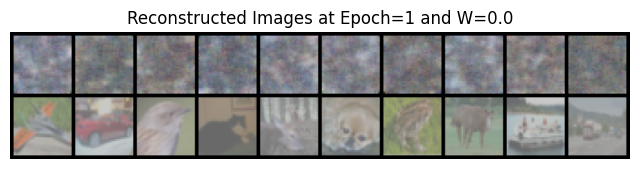

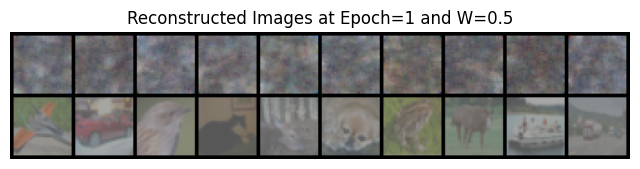

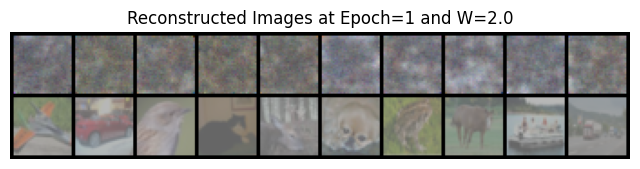

Epoch #2


loss: 0.0487: 100%|██████████| 196/196 [01:56<00:00,  1.68it/s]


Saved model at ./diffusion_model/model_1.pth
Epoch #3


loss: 0.0442: 100%|██████████| 196/196 [01:56<00:00,  1.68it/s]


Saved model at ./diffusion_model/model_2.pth
Epoch #4


loss: 0.0413: 100%|██████████| 196/196 [01:56<00:00,  1.68it/s]


Saved model at ./diffusion_model/model_3.pth
Epoch #5


loss: 0.0416: 100%|██████████| 196/196 [01:56<00:00,  1.68it/s]


Saved model at ./diffusion_model/model_4.pth
Epoch #6


loss: 0.0384: 100%|██████████| 196/196 [01:56<00:00,  1.68it/s]


Saved model at ./diffusion_model/model_5.pth



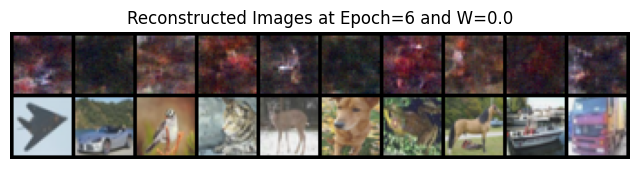

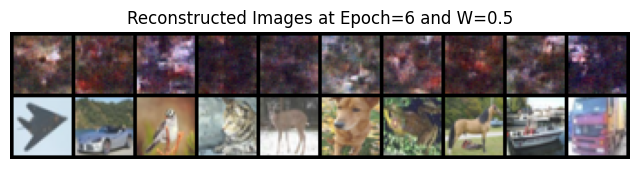

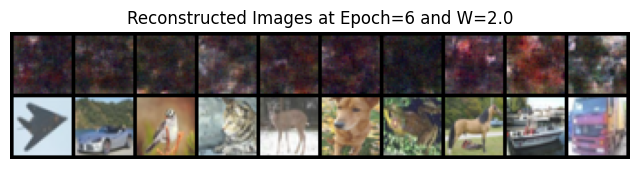

Epoch #7


loss: 0.0389: 100%|██████████| 196/196 [01:57<00:00,  1.67it/s]


Saved model at ./diffusion_model/model_6.pth
Epoch #8


loss: 0.0401: 100%|██████████| 196/196 [01:56<00:00,  1.68it/s]


Saved model at ./diffusion_model/model_7.pth
Epoch #9


loss: 0.0369: 100%|██████████| 196/196 [01:57<00:00,  1.67it/s]


Saved model at ./diffusion_model/model_8.pth
Epoch #10


loss: 0.0373: 100%|██████████| 196/196 [01:57<00:00,  1.67it/s]


Saved model at ./diffusion_model/model_9.pth
Epoch #11


loss: 0.0373: 100%|██████████| 196/196 [01:57<00:00,  1.67it/s]


Saved model at ./diffusion_model/model_10.pth



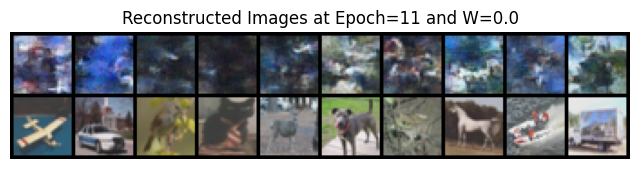

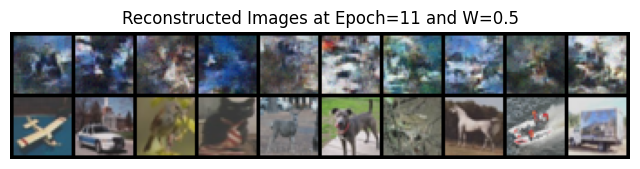

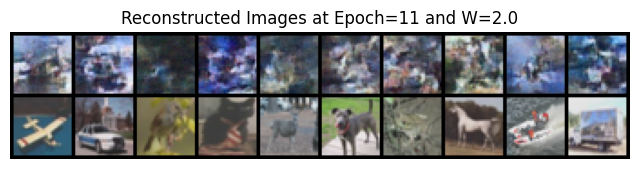

Epoch #12


loss: 0.0353: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_11.pth
Epoch #13


loss: 0.0344: 100%|██████████| 196/196 [01:57<00:00,  1.67it/s]


Saved model at ./diffusion_model/model_12.pth
Epoch #14


loss: 0.0346: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_13.pth
Epoch #15


loss: 0.0344: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_14.pth
Epoch #16


loss: 0.0340: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_15.pth



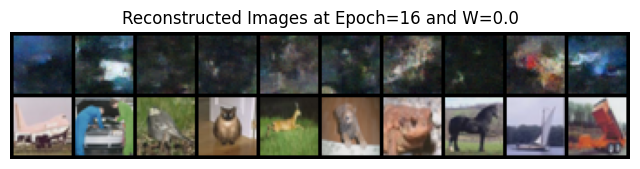

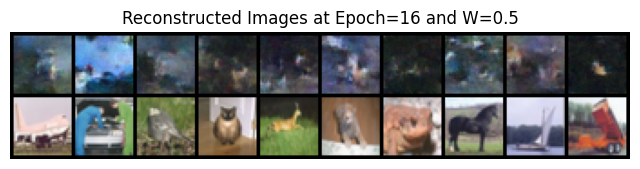

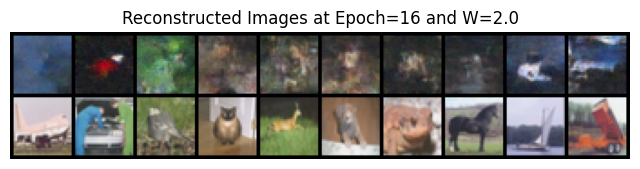

Epoch #17


loss: 0.0340: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_16.pth
Epoch #18


loss: 0.0346: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_17.pth
Epoch #19


loss: 0.0322: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_18.pth
Epoch #20


loss: 0.0320: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_19.pth
Epoch #21


loss: 0.0332: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_20.pth



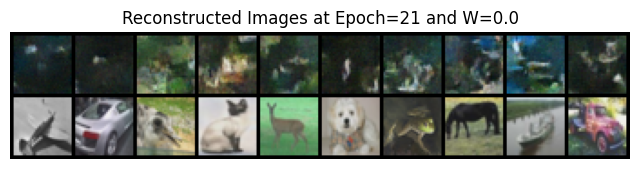

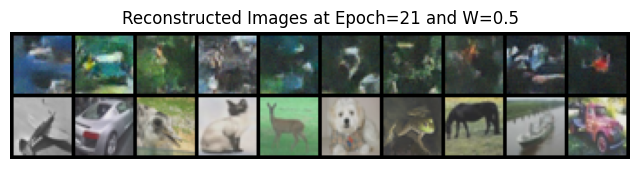

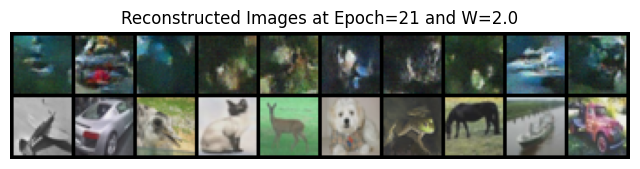

Epoch #22


loss: 0.0334: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_21.pth
Epoch #23


loss: 0.0322: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_22.pth
Epoch #24


loss: 0.0318: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_23.pth
Epoch #25


loss: 0.0313: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_24.pth
Epoch #26


loss: 0.0323: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_25.pth



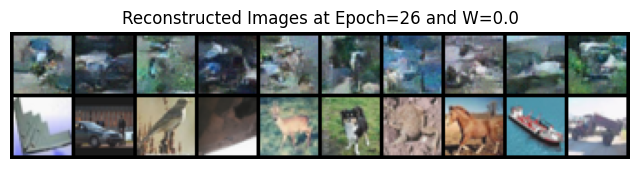

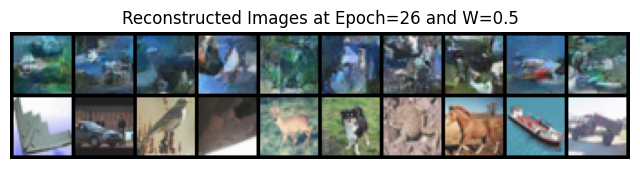

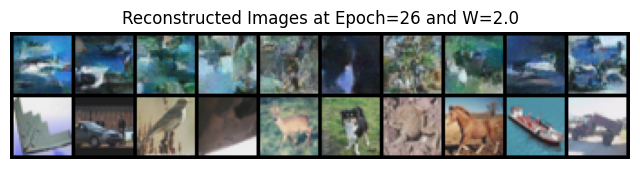

Epoch #27


loss: 0.0309: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_26.pth
Epoch #28


loss: 0.0311: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_27.pth
Epoch #29


loss: 0.0319: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_28.pth
Epoch #30


loss: 0.0310: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_29.pth
Epoch #31


loss: 0.0320: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_30.pth



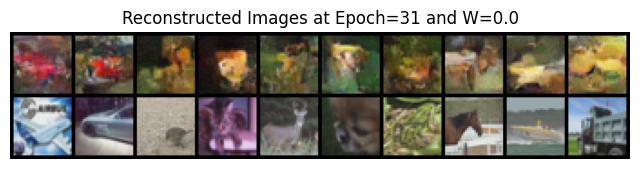

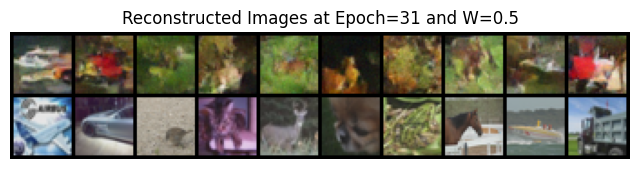

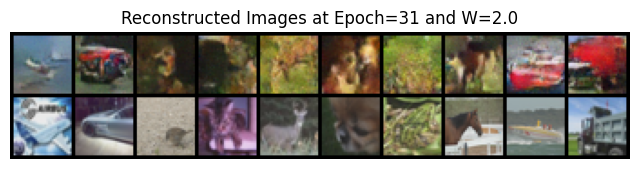

Epoch #32


loss: 0.0317: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_31.pth
Epoch #33


loss: 0.0309: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_32.pth
Epoch #34


loss: 0.0300: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_33.pth
Epoch #35


loss: 0.0305: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_34.pth
Epoch #36


loss: 0.0307: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_35.pth



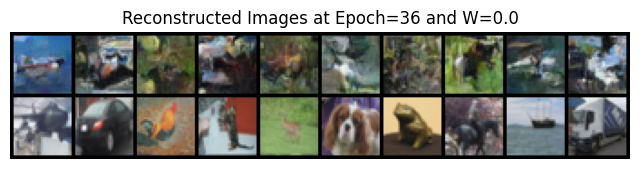

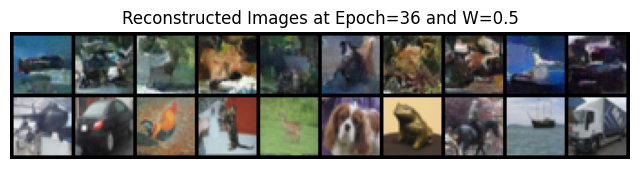

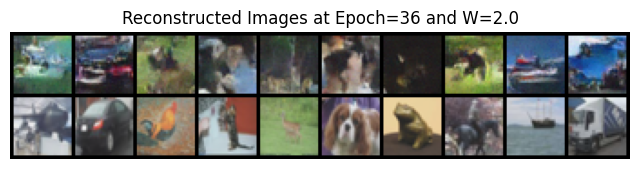

Epoch #37


loss: 0.0306: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_36.pth
Epoch #38


loss: 0.0303: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_37.pth
Epoch #39


loss: 0.0298: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_38.pth
Epoch #40


loss: 0.0305: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_39.pth
Epoch #41


loss: 0.0306: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_40.pth



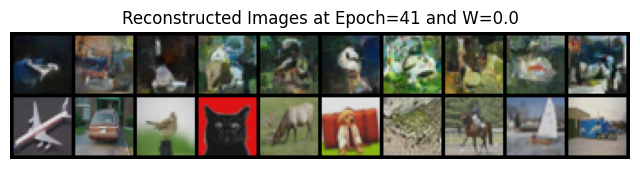

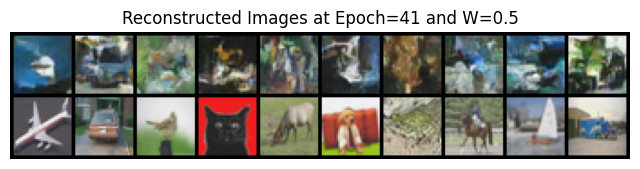

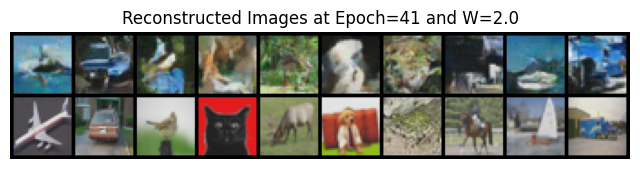

Epoch #42


loss: 0.0306: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_41.pth
Epoch #43


loss: 0.0301: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_42.pth
Epoch #44


loss: 0.0301: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_43.pth
Epoch #45


loss: 0.0301: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_44.pth
Epoch #46


loss: 0.0304: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_45.pth



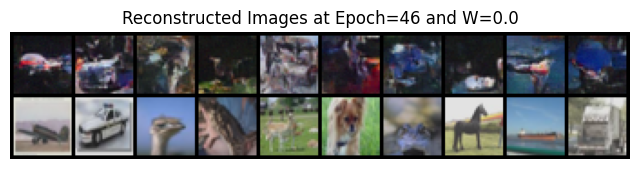

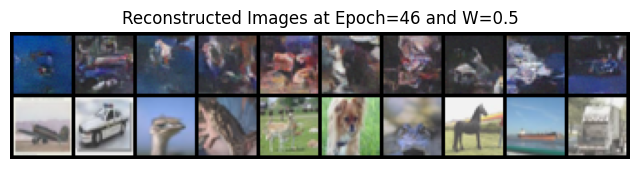

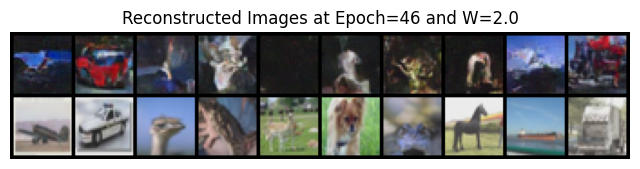

Epoch #47


loss: 0.0293: 100%|██████████| 196/196 [01:57<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_46.pth
Epoch #48


loss: 0.0290: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_47.pth
Epoch #49


loss: 0.0303: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_48.pth
Epoch #50


loss: 0.0298: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_49.pth
Epoch #51


loss: 0.0286: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_50.pth



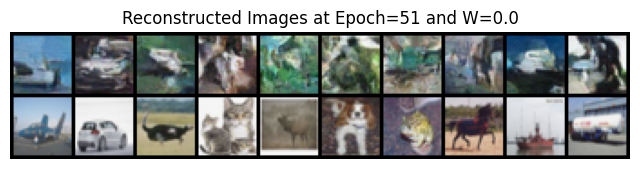

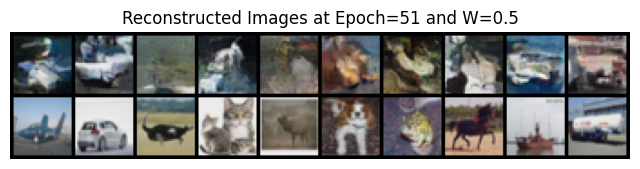

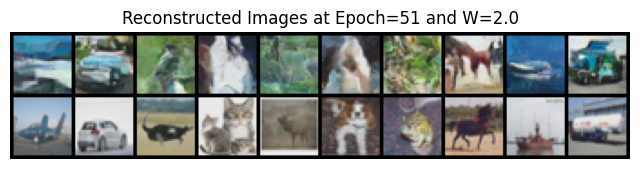

Epoch #52


loss: 0.0293: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_51.pth
Epoch #53


loss: 0.0287: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_52.pth
Epoch #54


loss: 0.0296: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_53.pth
Epoch #55


loss: 0.0293: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_54.pth
Epoch #56


loss: 0.0279: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_55.pth



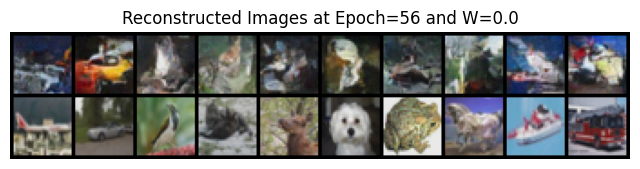

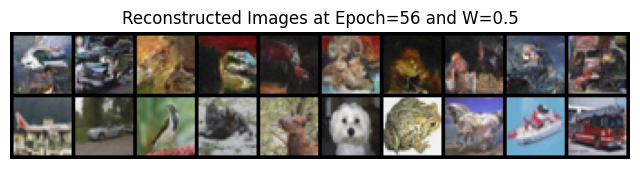

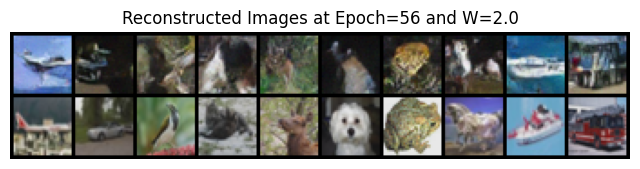

Epoch #57


loss: 0.0290: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_56.pth
Epoch #58


loss: 0.0296: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_57.pth
Epoch #59


loss: 0.0304: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_58.pth
Epoch #60


loss: 0.0298: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_59.pth
Epoch #61


loss: 0.0292: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_60.pth



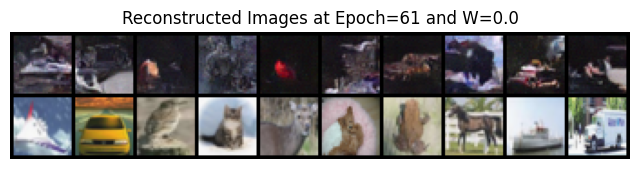

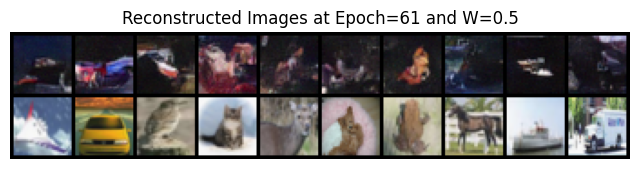

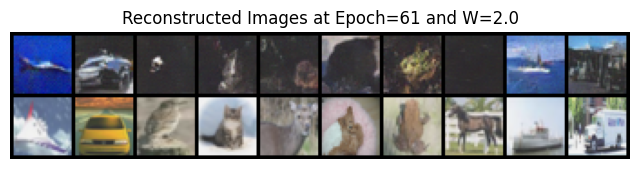

Epoch #62


loss: 0.0287: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_61.pth
Epoch #63


loss: 0.0293: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_62.pth
Epoch #64


loss: 0.0280: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_63.pth
Epoch #65


loss: 0.0298: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_64.pth
Epoch #66


loss: 0.0284: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_65.pth



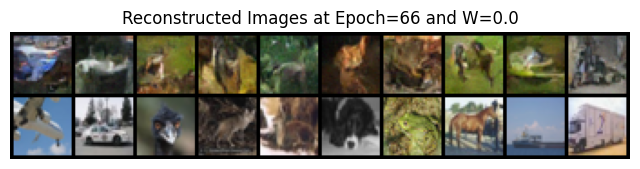

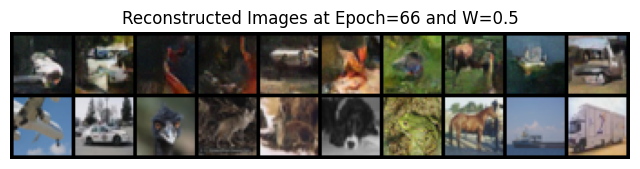

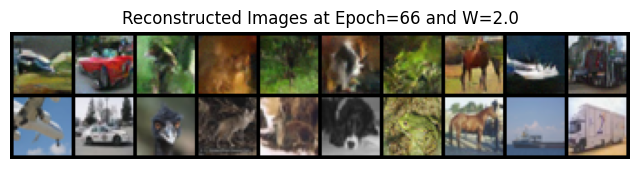

Epoch #67


loss: 0.0294: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_66.pth
Epoch #68


loss: 0.0284: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_67.pth
Epoch #69


loss: 0.0281: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_68.pth
Epoch #70


loss: 0.0296: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_69.pth
Epoch #71


loss: 0.0284: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_70.pth



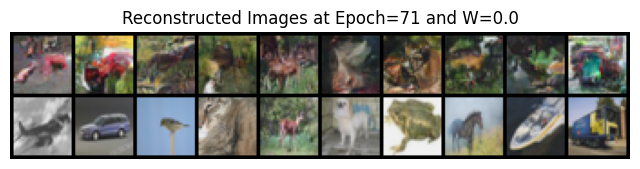

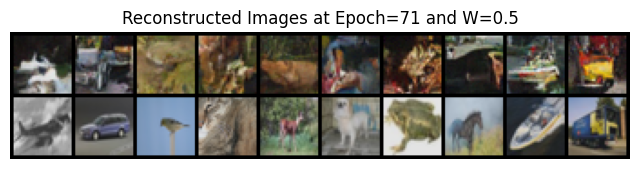

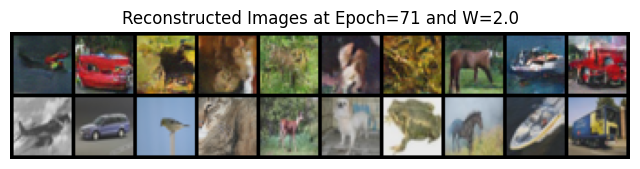

Epoch #72


loss: 0.0289: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_71.pth
Epoch #73


loss: 0.0275: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_72.pth
Epoch #74


loss: 0.0286: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_73.pth
Epoch #75


loss: 0.0294: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_74.pth
Epoch #76


loss: 0.0283: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_75.pth



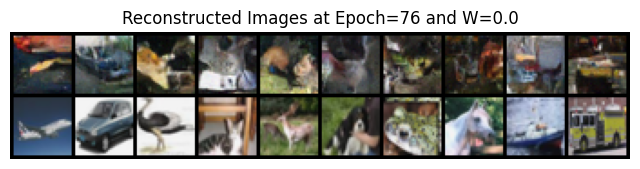

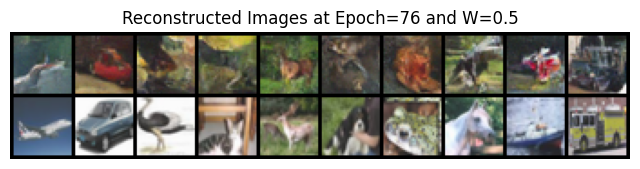

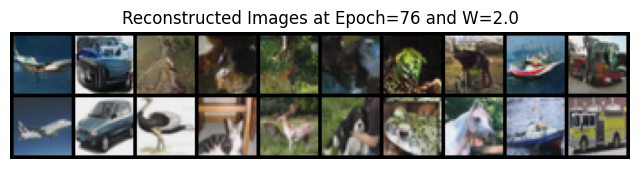

Epoch #77


loss: 0.0286: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_76.pth
Epoch #78


loss: 0.0282: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_77.pth
Epoch #79


loss: 0.0285: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_78.pth
Epoch #80


loss: 0.0284: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_79.pth
Epoch #81


loss: 0.0287: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_80.pth



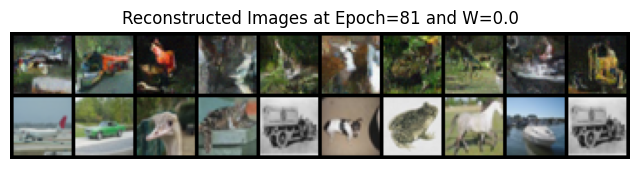

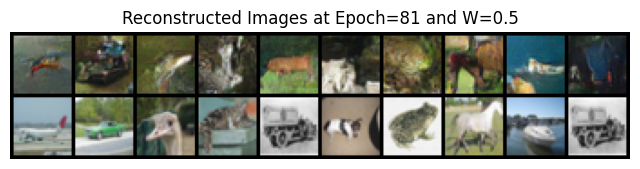

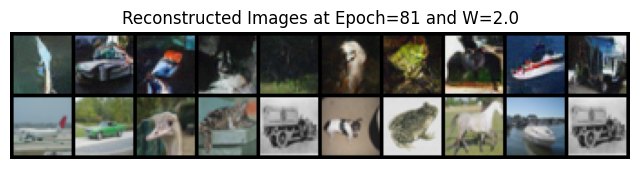

Epoch #82


loss: 0.0292: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_81.pth
Epoch #83


loss: 0.0281: 100%|██████████| 196/196 [01:58<00:00,  1.65it/s]


Saved model at ./diffusion_model/model_82.pth
Epoch #84


loss: 0.0293: 100%|██████████| 196/196 [01:58<00:00,  1.66it/s]


Saved model at ./diffusion_model/model_83.pth
Epoch #85


loss: 0.0279:  26%|██▌       | 50/196 [00:30<01:28,  1.65it/s]

In [ ]:
train(model, train_loader, optimizer)

## Generating Images

In [19]:
checkpoint = torch.load('/kaggle/input/diffusion-model-80-epoch/pytorch/default/1/model_80.pth')
model.load_state_dict(checkpoint)

<ipython-input-19-de01ae31eabc>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/kaggle/input/diffusion-model-80-epoch/pytorch/default/1/model_80.p

<All keys matched successfully>

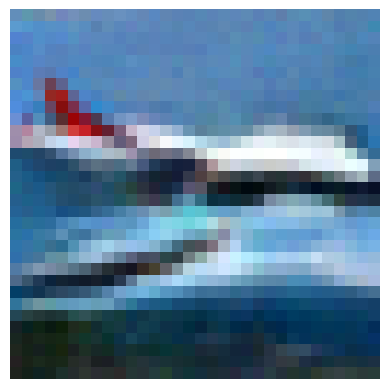

In [25]:
context_label = [0]
c = torch.tensor([context_label], dtype=torch.long)

model.eval()
with torch.no_grad():
    x_gen, x_gen_store = model.sample_single(1, (3, 32, 32), device, c, guide_w=4.0)
    numpy_array = x_gen[0].squeeze(0).cpu().detach().numpy()
    numpy_array = np.transpose(numpy_array, (1, 2, 0))  # Transpose to (32, 32, 3)
    plt.imshow(numpy_array, cmap='gray')
    plt.axis('off')
    plt.show()

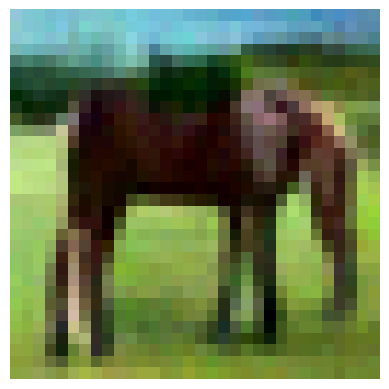

In [26]:
context_label = [7]
c = torch.tensor([context_label], dtype=torch.long)

model.eval()
with torch.no_grad():
    x_gen, x_gen_store = model.sample_single(1, (3, 32, 32), device, c, guide_w=4.0)
    numpy_array = x_gen[0].squeeze(0).cpu().detach().numpy()
    numpy_array = np.transpose(numpy_array, (1, 2, 0))  # Transpose to (32, 32, 3)
    plt.imshow(numpy_array, cmap='gray')
    plt.axis('off')
    plt.show()

## Training the Model with Noise Steps 500

In [27]:
noise_steps = 500

In [28]:
model = DDPM(
    nn_model=ContextUnet(
        in_channels=3, n_feat=n_feat, n_classes=num_classes
    ), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1
).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

Epoch #1


loss: 0.0578: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_0.pth



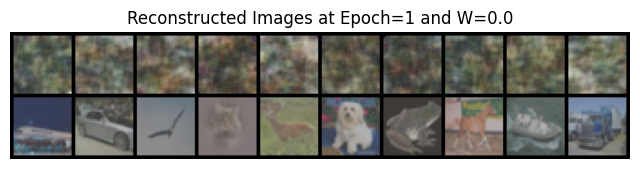

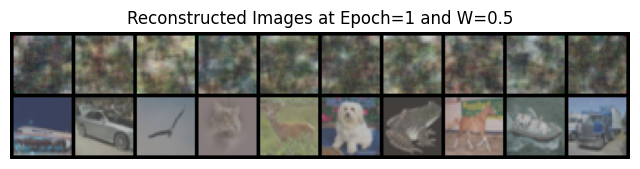

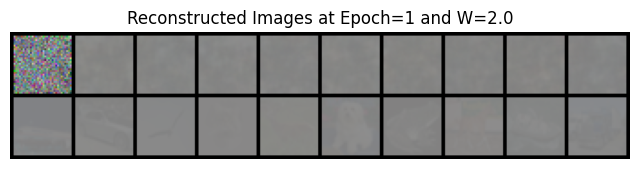

Epoch #2


loss: 0.0465: 100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


Saved model at ./diffusion_model/model_1.pth
Epoch #3


loss: 0.0447: 100%|██████████| 196/196 [01:01<00:00,  3.19it/s]


Saved model at ./diffusion_model/model_2.pth
Epoch #4


loss: 0.0409: 100%|██████████| 196/196 [01:01<00:00,  3.19it/s]


Saved model at ./diffusion_model/model_3.pth
Epoch #5


loss: 0.0408: 100%|██████████| 196/196 [01:01<00:00,  3.21it/s]


Saved model at ./diffusion_model/model_4.pth
Epoch #6


loss: 0.0385: 100%|██████████| 196/196 [01:01<00:00,  3.21it/s]


Saved model at ./diffusion_model/model_5.pth



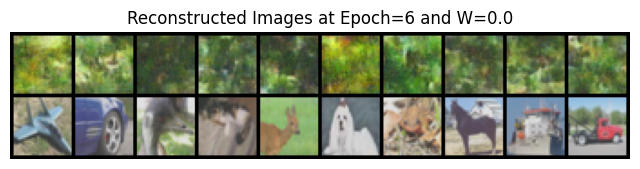

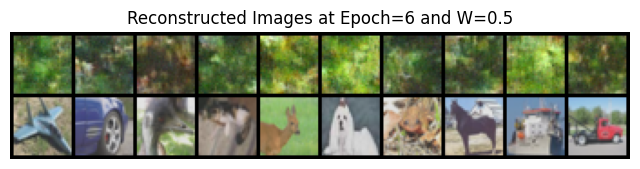

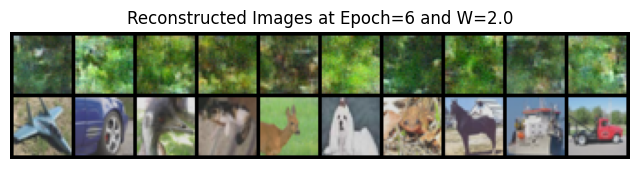

Epoch #7


loss: 0.0382: 100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


Saved model at ./diffusion_model/model_6.pth
Epoch #8


loss: 0.0370: 100%|██████████| 196/196 [01:01<00:00,  3.21it/s]


Saved model at ./diffusion_model/model_7.pth
Epoch #9


loss: 0.0384: 100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


Saved model at ./diffusion_model/model_8.pth
Epoch #10


loss: 0.0376: 100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


Saved model at ./diffusion_model/model_9.pth
Epoch #11


loss: 0.0358: 100%|██████████| 196/196 [01:01<00:00,  3.20it/s]


Saved model at ./diffusion_model/model_10.pth



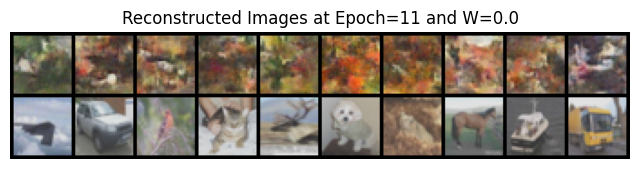

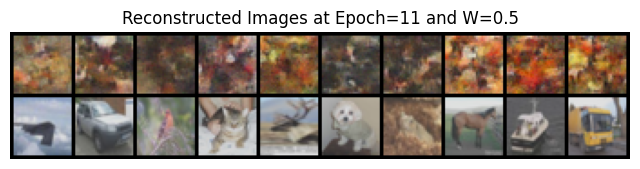

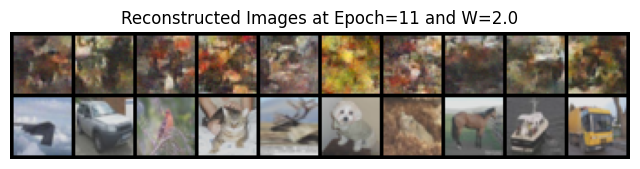

Epoch #12


loss: 0.0351: 100%|██████████| 196/196 [01:01<00:00,  3.21it/s]


Saved model at ./diffusion_model/model_11.pth
Epoch #13


loss: 0.0339: 100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


Saved model at ./diffusion_model/model_12.pth
Epoch #14


loss: 0.0342: 100%|██████████| 196/196 [01:00<00:00,  3.23it/s]


Saved model at ./diffusion_model/model_13.pth
Epoch #15


loss: 0.0340: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_14.pth
Epoch #16


loss: 0.0336: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_15.pth



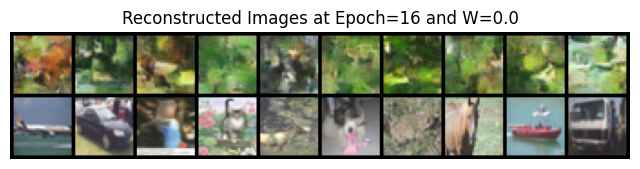

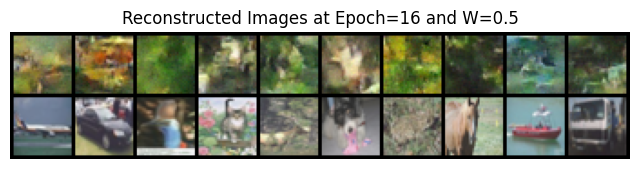

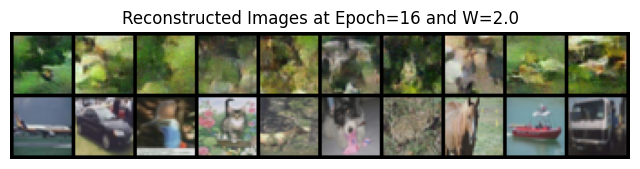

Epoch #17


loss: 0.0347: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_16.pth
Epoch #18


loss: 0.0328: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_17.pth
Epoch #19


loss: 0.0331: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_18.pth
Epoch #20


loss: 0.0333: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_19.pth
Epoch #21


loss: 0.0345: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_20.pth



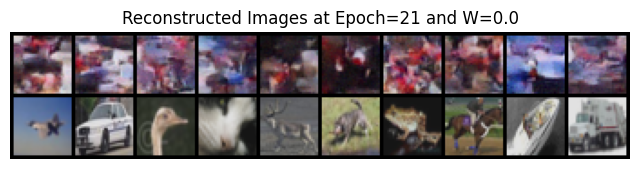

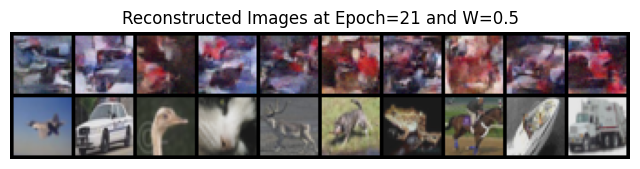

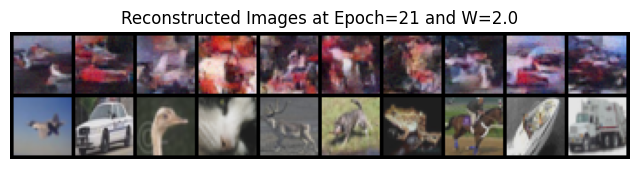

Epoch #22


loss: 0.0334: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_21.pth
Epoch #23


loss: 0.0324: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_22.pth
Epoch #24


loss: 0.0328: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_23.pth
Epoch #25


loss: 0.0307: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_24.pth
Epoch #26


loss: 0.0304: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_25.pth



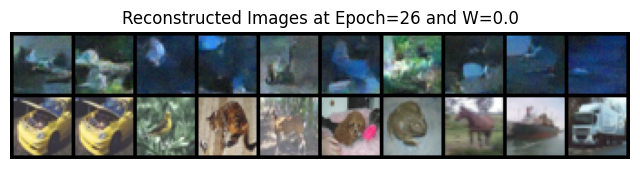

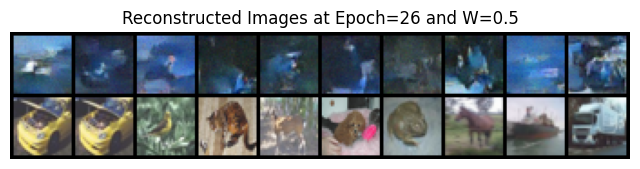

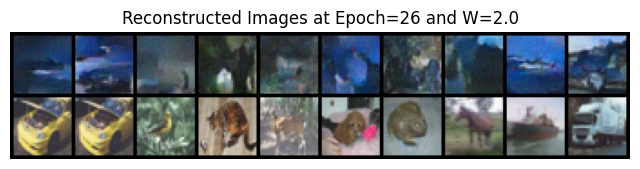

Epoch #27


loss: 0.0319: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_26.pth
Epoch #28


loss: 0.0317: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_27.pth
Epoch #29


loss: 0.0320: 100%|██████████| 196/196 [01:01<00:00,  3.18it/s]


Saved model at ./diffusion_model/model_28.pth
Epoch #30


loss: 0.0308: 100%|██████████| 196/196 [01:01<00:00,  3.19it/s]


Saved model at ./diffusion_model/model_29.pth
Epoch #31


loss: 0.0307: 100%|██████████| 196/196 [01:01<00:00,  3.21it/s]


Saved model at ./diffusion_model/model_30.pth



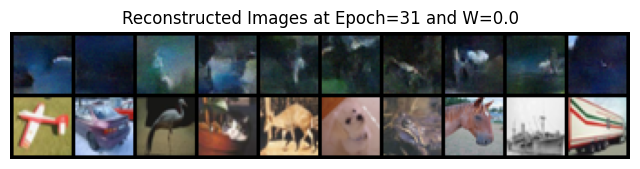

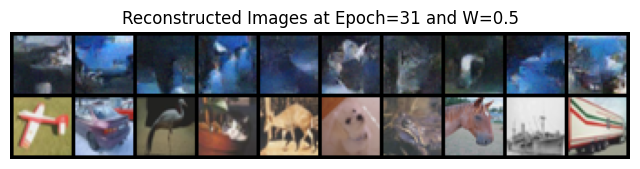

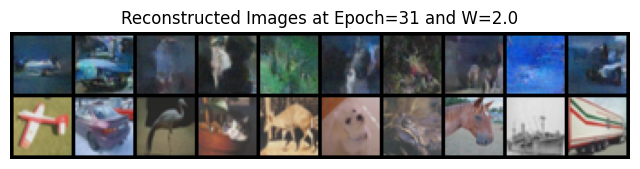

Epoch #32


loss: 0.0307: 100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


Saved model at ./diffusion_model/model_31.pth
Epoch #33


loss: 0.0316: 100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


Saved model at ./diffusion_model/model_32.pth
Epoch #34


loss: 0.0303: 100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


Saved model at ./diffusion_model/model_33.pth
Epoch #35


loss: 0.0308: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_34.pth
Epoch #36


loss: 0.0301: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_35.pth



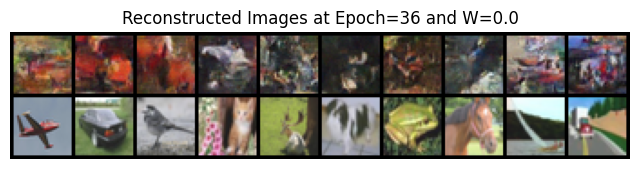

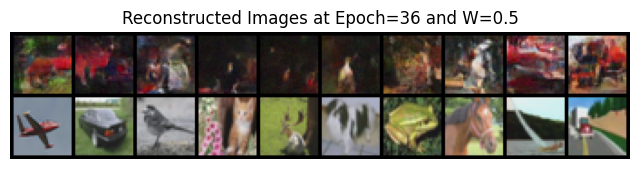

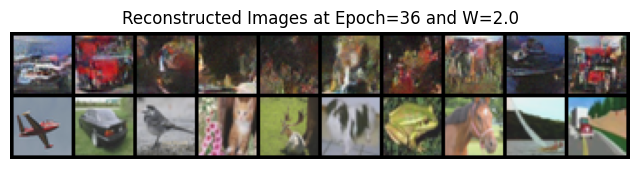

Epoch #37


loss: 0.0311: 100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


Saved model at ./diffusion_model/model_36.pth
Epoch #38


loss: 0.0305: 100%|██████████| 196/196 [01:00<00:00,  3.25it/s]


Saved model at ./diffusion_model/model_37.pth
Epoch #39


loss: 0.0309: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_38.pth
Epoch #40


loss: 0.0306: 100%|██████████| 196/196 [01:00<00:00,  3.24it/s]


Saved model at ./diffusion_model/model_39.pth
Epoch #41


loss: 0.0315:  57%|█████▋    | 111/196 [00:34<00:26,  3.24it/s]

In [ ]:
train(model, train_loader, optimizer)

## Compare Models

<ipython-input-24-d35e11c1c575>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/kaggle/input/diffusion-model-80-epoch/pytorch/default/1/model_80.p

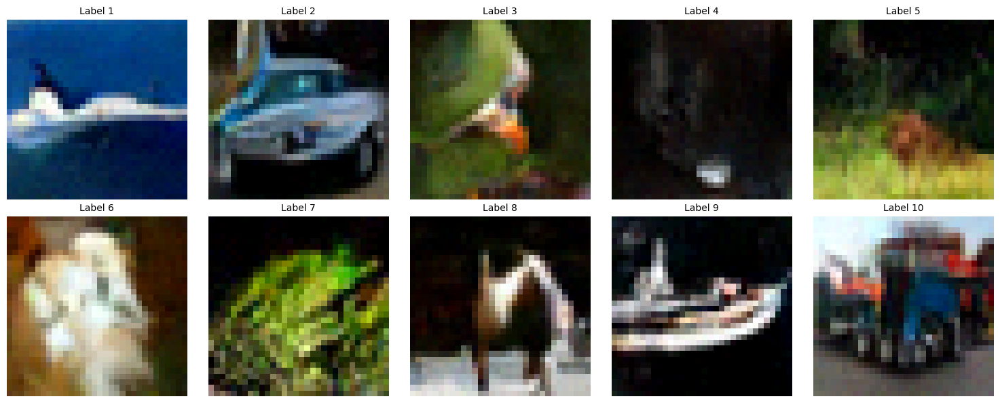

In [24]:
noise_steps = 1000
model = DDPM(
    nn_model=ContextUnet(
        in_channels=3, n_feat=n_feat, n_classes=num_classes
    ), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1
).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
checkpoint = torch.load('model_80.pth')
model.load_state_dict(checkpoint)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, context_label in enumerate(range(10)):
    c = torch.tensor([[context_label]], dtype=torch.long)  # Update context_label for each iteration

    model.eval()
    with torch.no_grad():
        # Generate the image
        x_gen, x_gen_store = model.sample_single(1, (3, 32, 32), device, c, guide_w=4.0)
        numpy_array = x_gen[0].squeeze(0).cpu().detach().numpy()
        numpy_array = np.transpose(numpy_array, (1, 2, 0))  # Transpose to (32, 32, 3)

        # Calculate row and column indices
        row = i // 5
        col = i % 5

        # Display the image
        axes[row, col].imshow(numpy_array, cmap='gray')
        axes[row, col].axis('off')
        axes[row, col].set_title(f"Label {context_label + 1}", fontsize=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

<ipython-input-26-089f64d1dc29>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/kaggle/input/diffusion-model-80-epoch-500/pytorch/default/1/model_

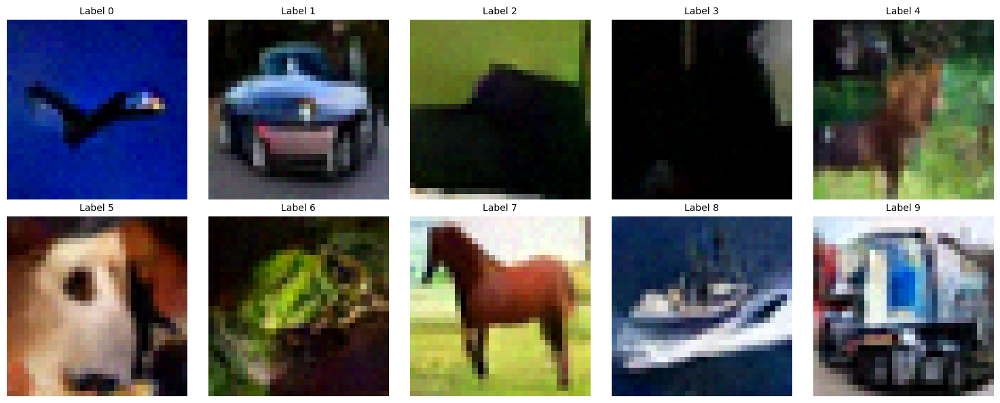

In [26]:
noise_steps = 500
model = DDPM(
    nn_model=ContextUnet(
        in_channels=3, n_feat=n_feat, n_classes=num_classes
    ), betas=(1e-4, 0.02), n_T=n_T, device=device, drop_prob=0.1
).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
checkpoint = torch.load('model_80_500.pth')
model.load_state_dict(checkpoint)


fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, context_label in enumerate(range(10)):
    c = torch.tensor([[context_label]], dtype=torch.long)  # Update context_label for each iteration

    model.eval()
    with torch.no_grad():
        # Generate the image
        x_gen, x_gen_store = model.sample_single(1, (3, 32, 32), device, c, guide_w=4.0)
        numpy_array = x_gen[0].squeeze(0).cpu().detach().numpy()
        numpy_array = np.transpose(numpy_array, (1, 2, 0))  # Transpose to (32, 32, 3)

        # Calculate row and column indices
        row = i // 5
        col = i % 5

        # Display the image
        axes[row, col].imshow(numpy_array, cmap='gray')
        axes[row, col].axis('off')
        axes[row, col].set_title(f"Label {context_label}", fontsize=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()